<table>
<tr><td><img style="height: 150px;" src="images/geo_hydro1.jpg"></td>
<td bgcolor="#FFFFFF">
    <p style="font-size: xx-large; font-weight: 900; line-height: 100%">pyVIRUS</p>
    <p style="font-size: large; color: rgba(0,0,0,0.5);"><b style=color:red;>Virus</b> modelling</p>
    <p style="font-size: large; color: rgba(0,0,0,0.5);">Georg Kaufmann</p>
    </td>
<td><img style="height: 150px;" src="images/pyVIRUS.png"></td>
</tr>
</table>

----
# `pyVIRUS`

pyVIRUS, a program package for for modelling the spread and containment of a virus in a population.

# <a id="top">Corona pandemic: random-walk models</a>
----
*Georg Kaufmann,
Geophysics Section,
Institute of Geological Sciences,
Freie Universität Berlin,
Germany*

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, display

In this notebook, we define a random-walk model for virus infections. 
- We assume that a number $N$ of people runs around (e.g. in a city), and initially only one person is infected. 
- Once this person "meets" with another person, this person is infected, too.
- An infected person will recover after a grace period.

## Setup

We now start to define our random-walk problem. 
- We create a *city* as a rectangular area, with `x` and `y` the 2D coordinate arrays, and the area normalized to $x \in [0,1]$ and $y \in [0,1]$.
- We will populate the area with `N` individuals, which will be positioned randomly wuthin the area.
- We set the number of days `days` the simulation should run. 

<img src="images/RandomSketch.jpg" alt="Sketch of model">

Both the number of individuals `N` and the number of days `days` are **input** quantities, queried with the `input` function.

To make the runs comparable, we use a **fixed** random seed. Then, the positions $x$ and $y$ are
filled with **uniform random numbers** between 0 and 1. 

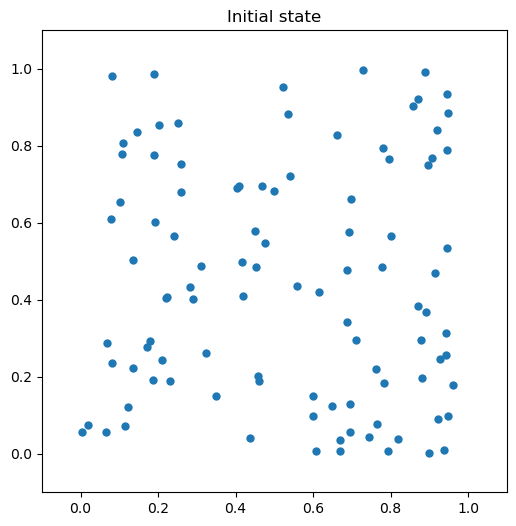

In [2]:
# ask for number of individuals and days to run simulation
def coronaRandomInit(N=100,days=150):
    """
    Corona pandemic: random-walk models
    """
    # assign initial random positions
    rng = np.random.default_rng(seed=12)
    x  = rng.uniform(0,1,N)
    y  = rng.uniform(0,1,N)
    # mark people
    # infection parameter
    return x,y,days

x,y,days = coronaRandomInit()

plt.figure(figsize=(6,6))
plt.title('Initial state')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.scatter(x,y,lw=0,marker='o')

----
## Tracking of infection
Next, every individual has a `state` assigned:
- $state=0$: susceptible for invection
- $state>0$: infected, counter is number of days infected
- $state=-1$: recovered person
Note: As initial step, **one** individual (the *spreader*) is infected, thus all `state` entries are zero except one.

Another array, `people`, is a two-dimensional array, holding, for one time step:
- time step
- number of **susceptible** people
- number of **invected** people
- number of **recovered** people
The `people` array for time step `0`, one infected, the rest susceptible, then looks then like `(0,N-1,1,0)`.

One more array, `mark`, will keep colors for the individuals, depending on their state:
- blue: susceptible
- red: infected 
- green: recovered

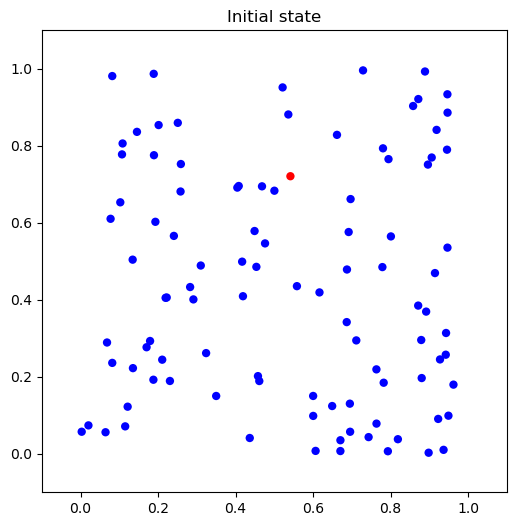

In [3]:
def coronaRandomInit(N=100,days=150,spreader=11):
    """
    Corona pandemic: random-walk models
    Set inidial positions and state
    input:
      N          - number of individuals
      days       - number of days to simulate
      spreader   - position of initial spreader
    output:
      x,y        - x- and y-coordinates of people
      state      - state of people (0-susceptible,>0-infected)
      mark       - color for state
      people     - array of susceptible/infected/recovered people
      mobility   - mobility per time step
      infectDist - minimum infection distance
      infectDays - days infected
    """
    # assign initial random positions
    rng = np.random.default_rng(seed=12)
    x  = rng.uniform(0,1,N)
    y  = rng.uniform(0,1,N)
    # mark people
    # assign state: zero (susceptible) for most, and one infected person
    # mark each individual with a color (blue-susceptible,red-infected,green-recovered)
    state  = np.zeros(N)
    people = np.array([[0,N-1,1,0]])
    mark   = np.repeat('b',N)
    # define single spreader
    state[spreader] = 1
    mark[spreader] = 'r'
    return x,y,days,state,mark,people

x,y,days,state,mark,people = coronaRandomInit()

plt.figure(figsize=(6,6))
plt.title('Initial state')
plt.xlim([-0.1,1.1])
plt.ylim([-0.1,1.1])
plt.scatter(x,y,lw=0,marker='o',color=mark)

----
## Infection parameter
Finally, we define 
- a `mobility` radius (in normalised coordinates $0.05$  would be 50m in a 1x1 km array).
- a minimum distance `infectDist` $0.05$, which two individuals have to reach for transmitting the infection.
- The length of the invection is defined as `infectDays`, 15 days in our case.

## <a id="plot">Plot layout</a>

In this next step, we design the plot layout. 

We need two plots, one for the area, one for the time series. Thus the call to `subplot2grid`, we
define a 3x2 raster: 
- first plot `plot1` the top row for the time series. 
- second plot `plot2` the middle and bottom row for the areal plot.

We set titles (`set_title`), axis labels (`set_xlabel`), axis ranges (`set_xlim`).
The time series are plotted as filled polygons, with the function `fill_between`.
The individuals are plotted as markes, using the `scatter` function.

In [4]:
def coronaRandomPlot(day,days,x,y,mark,people,path='work/',plot=False):
    """
    Corona pandemic: random-walk models
    plot state for specific day and location of individuals
    input:
      N          - number of individuals (from x)
      day,days   - number of days to simulate
      x,y        - x- and y-coordinates of people
      mark       - color for state
      people     - array of susceptible/infected/recovered people
    output:
      (to file)
    """
    filename = f"infection-{day:04}.png"
    N = x.shape[0]
    plt.figure(figsize=(6.0,8.0))
    plot1=plt.subplot2grid((3,2), (0,0), colspan=2)
    plot2=plt.subplot2grid((3,2), (1,0), colspan=2,rowspan=2)
    plot1.set_title('Simulated Infection')
    plot1.set_xlabel('Time [days]')
    plot1.set_ylabel('No. of people')
    plot1.set_xlim([0,days-1])
    plot1.set_ylim([0,1.00*N])
    #plot1.plot(people[:,0],people[:,1],linewidth='2',color='b',marker='o',label='susceptible')
    #plot1.plot(people[:,0],people[:,2],linewidth='2',color='r',marker='o',label='invected')
    #plot1.plot(people[:,0],people[:,3],linewidth='2',color='g',marker='o',label='recovered')
    plot1.plot(day,20.,marker='o')
    plot1.fill_between(people[:,0],0,people[:,2],linewidth=0,color='r',label='invected')
    plot1.fill_between(people[:,0],people[:,2],people[:,2]+people[:,3],linewidth=0,color='g',label='recovered')
    plot1.fill_between(people[:,0],people[:,2]+people[:,3],people[:,2]+people[:,3]+people[:,1],linewidth=0,color='b',label='recovered')
    plot2.set_xlim([-0.1,1.1])
    plot2.set_ylim([-0.1,1.1])
    plot2.scatter(x,y,s=90,color=mark)
    plt.tight_layout()
    print(day,end=' ')
    plt.savefig(path+filename)
    if (not plot):
        plt.close()
    return

We test our layout by calling the function. The function needs several arguments:

- actual day.
- total number of days (for time series axis).
- array of coordinates $x$ and $y$.
- the arrays `mark` and `people`.
- name of plot file to save.

0 

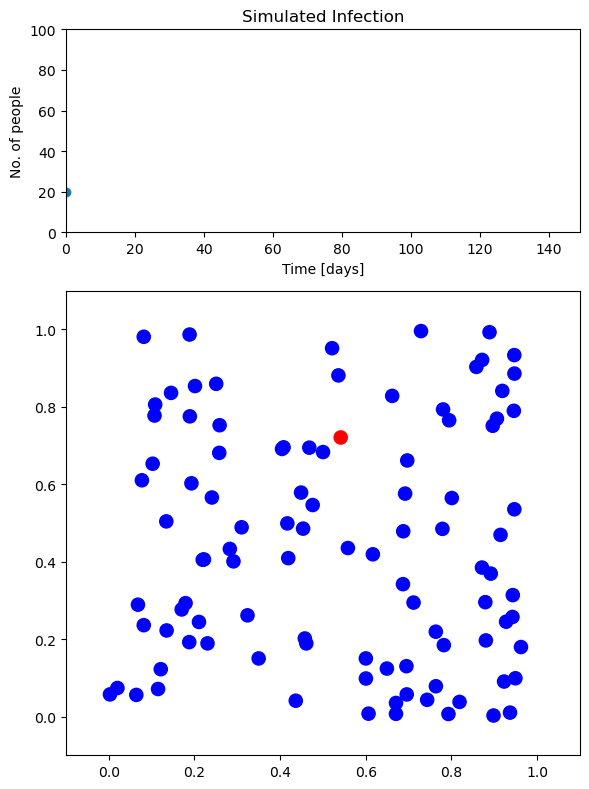

In [5]:
coronaRandomPlot(0,days,x,y,mark,people,plot=True)

## <a id="individuals">Moving individuals</a>

Once we start to make the individuals moving, we need to think about a presentation strategy:
- We could plot simply lots of files and compile them later to a movie (actually a good option, as
this is very flexible).
- Or we use `matplotlib` capabilities for animation.

We first follow the first strategy...

Define a new function `Infection`, which wraps around our plotting function `plot`.
It also takes quite a few arguments...
The core part updates the position vector $(x,y)$ by shaking the position with a random number
between -1 and 1, then multiplied by the scaled *mobility* distance. To make sure that no one
leaves the defined area, we cut movements out of the box to the margin.

In [8]:
def coronaRandomRun(mobility=0.05,infectDist=0.05,infectDays=15,path='work/'):
    """
    Corona pandemic: random-walk models
    Run a model
    input:
      mobility   - mobility per time step
      infectDist - minimum infection distance
      infectDays - days infected
      path       - path for plots
    output:
      (none)
    """
    # set initial conditions and first plot
    xo,yo,days,state,mark,people = coronaRandomInit()
    N = xo.shape[0]
    #coronaRandomPlot(0,days,xo,yo,mark,people,path=path,plot=False)
    # loop over simulation time
    rng = np.random.default_rng(seed=12)
    for day in range(days):
        # move people randomly
        x = xo + mobility*rng.uniform(-1,1,N)
        y = yo + mobility*rng.uniform(-1,1,N)
        x=np.where(x > 1, 1,x)
        x=np.where(x < 0, 0,x)
        y=np.where(y > 1, 1,y)
        y=np.where(y < 0, 0,y)
        coronaRandomPlot(day,days,x,y,mark,people,path=path,plot=False)
        # ...
        mark = np.repeat('b',N)
        for i in range(N):
            if (state[i] > 0):
                state[i] = state[i] + 1
                if (state[i] > infectDays):
                    state[i] = -1
            for j in range(N):
                if (i != j):
                    distance = np.sqrt((x[i]-x[j])**2 + (y[i]-y[j])**2)
                    if (distance < infectDist and state[i] == 0 and state[j] > 0):
                        state[i] = 1
        for i in range(N):
            if (state[i] > 0):
                mark[i] = 'r'
            if (state[i] < 0):
                mark[i] = 'g'
        susceptible = 0;infected=0;recovered=0
        for i in range(N):
            if (state[i] == 0):
                susceptible = susceptible+1
            elif (state[i] > 0):
                infected = infected+1
            else:
                recovered = recovered+1
        people = np.append(people,[[day+1,susceptible,infected,recovered]],axis=0)
        # update coordinates
        xo=np.copy(x);yo=np.copy(yo)
    return

Check if it works by looping over all days defined and calling the function:

In [7]:
coronaRandomRun()

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 

## <a id="invection">Infecting ...</a>

Now we need to put the **infection** into the story. This is simply done by re-setting the
*mark* array.

Remember, we have the *state* array to track the state of an individual:
- $state=0$ a susceptible individual
- $state>0$ an infected individual, we count days by increasing the *state* number
- $state=-1$ a recovered individual
- $state > days\_infected$ If the infected person has been invected for the pre-defined duration time 
(*days_infected*), it has recovered, and is marked with $state=-1$.

If an individual susceptible comes too close to an infected person, it is also infected.

After updating the *state* array, we assign the markers to the *mark* array.

Finally, we count:
- *susceptible*: No of susceptible individuals
- *infected*: No of infected individuals
- *recovered*: No of recovered individuals

In [8]:
def coronaRandomRun(mobility=0.05,infectDist=0.05,infectDays=15,path='work/'):
    """
    Corona pandemic: random-walk models
    Run a model
    input:
      mobility   - mobility per time step
      infectDist - minimum infection distance
      infectDays - days infected
      path       - path
    """
    # set initial conditions and first plot
    xo,yo,days,state,mark,people = coronaRandomInit()
    N = xo.shape[0]
    #coronaRandomPlot(0,days,xo,yo,mark,people,path=path,plot=False)
    # loop over simulation time
    rng = np.random.default_rng(seed=12)
    for day in range(days):
        # move people randomly
        x = xo + mobility*rng.uniform(-1,1,N)
        y = yo + mobility*rng.uniform(-1,1,N)
        x=np.where(x > 1, 1,x)
        x=np.where(x < 0, 0,x)
        y=np.where(y > 1, 1,y)
        y=np.where(y < 0, 0,y)
        coronaRandomPlot(day,days,x,y,mark,people,path=path,plot=False)
        # ...
        mark = np.repeat('b',N)
        for i in range(N):
            if (state[i] > 0):
                state[i] = state[i] + 1
                if (state[i] > infectDays):
                    state[i] = -1
            for j in range(N):
                if (i != j):
                    distance = np.sqrt((x[i]-x[j])**2 + (y[i]-y[j])**2)
                    if (distance < infectDist and state[i] == 0 and state[j] > 0):
                        state[i] = 1
        for i in range(N):
            if (state[i] > 0):
                mark[i] = 'r'
            if (state[i] < 0):
                mark[i] = 'g'
        susceptible = 0;infected=0;recovered=0
        for i in range(N):
            if (state[i] == 0):
                susceptible = susceptible+1
            elif (state[i] > 0):
                infected = infected+1
            else:
                recovered = recovered+1
        people = np.append(people,[[day+1,susceptible,infected,recovered]],axis=0)
        # update coordinates
        xo=np.copy(x);yo=np.copy(yo)
    return

In [14]:
coronaRandomRun(path='div/1/')
#coronaRandomRun(infectDist=0.08,path='div/2/')

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 

----
## Create animation sequence

In [15]:
import matplotlib.image as mpimg
import matplotlib.animation as animation
import glob
# list all png files in directory
imageList = sorted(glob.glob("div/2/infection-0*.png"))
#print(imageList)

# define figure handle and empty array for list of figures    
fig = plt.figure(figsize=(4, 6),frameon=False)
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)
ims = []
# loop over all figures, load them into image and apprend to array ims
for i in range(len(imageList)):
    image = mpimg.imread(imageList[i])
    plt.axis('off')
    img=plt.imshow(image)
    #print(i,getImageFromList(i))
    ims.append([img])
# create an animation object
ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True, repeat=False) 
plt.close()
print(ani)

In [17]:
HTML(ani.to_jshtml())

----